<a href="https://colab.research.google.com/github/ericwang10/TicTacToe-Minimax/blob/main/tictactoe-minimax.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Making a few classes for our search tree


In [ ]:
import numpy as np
from numpy.random import seed, randint
import ipywidgets as widgets # for the interactive user interface
from ipywidgets import interact, interactive_output, HBox, VBox, Layout
from IPython.display import display, clear_output, SVG, HTML
import graphviz as gv # for visualizing a tree using Digraph
from graphviz import Digraph
import pydot

In [ ]:
#our nodes class, represents ONE tic tac toe game state  
class TreeNode:
    def __init__(self, key):
        self.key = key
        self.parent = None
        self.children = [] #each node can have multiple children 
        self.optimizer = None
        self.reward = None #reward is for determining the outcome of the game
    def to_string(self):
        return str(self.key)
    def print(self):        
        print("TreeNode: %d" % (self.key))
    def add_child(self, node):
        self.children.append(node)

n10 = TreeNode(10)
n5 = TreeNode(5)
n14 = TreeNode(14)
# Create tree by linking the tree nodes
n5.parent = n10; n14.parent = n10
n10.add_child(n5)
n10.add_child(n14)
print([n10.to_string(), n10.children])

['10', [<__main__.TreeNode object at 0x7f39b78e0c90>, <__main__.TreeNode object at 0x7f39b78e0d50>]]


In [ ]:
#the formatting required for displaying the board states
test = "X|O|O\n ⎯ ⎯ ⎯ \n |  | \n ⎯ ⎯ ⎯ \n |  | "
print(test) 

X|O|O
 ⎯ ⎯ ⎯ 
 |  | 
 ⎯ ⎯ ⎯ 
 |  | 


In [ ]:
#class for creating our tree, which will explore all possible game options 
class TicTacTree():
    def __init__(self):
        self.root = None # Root of the tree
        self.list = [] # Elements of the tree as list
    # Insert a new node  
    def insert(self, k, p = None): #self is object, k is key, parent is parent
        ''' Insert a key '''
        newNode = TreeNode(k) #create a new node with our key. Our key is our game state in a string format
        # If the tree is empty, the new node is the root
        if self.root == None:
            self.root = newNode
            newNode.optimzer = "max"
        else:        #tree not empty 
            x = self.root
            newNode.parent = p       #make newNode's parent the parent we pass in 
            if p != None: #we want to add the child to the parent node's children list   
              p.add_child(newNode) #this way we can find all children from a parent 

              #for determining minimax
              if p.optimzer == "max": #we set the current node's status as min or max based on parent. This represents alternating turns  
                newNode.optimzer = "min"
              else:
                newNode.optimzer = "max"

        return newNode #return the node
        

                      
    def height(self, x):
        if (x == None):
            return 0
        else: 
            return 1 + np.maximum(self.height(x.left),  self.height(x.right))
    
    #this method will visualize our tree 
    #don't worry too much about the details, lots of formatting stuff 
    def visualize(self, node = None):   
        ''' Visualize the tree using graphviz '''
        tree = self.root              
        # Recursively add nodes and edges, visualizing tree 
        def add_nodes_edges(tree, dot=None):
            col = "black"           
            # Create Graphviz Digraph 
            if dot is None:
                dot = Digraph(node_attr = {'fixedsize': 'true', 'width': '2', "height": "2" }, #manually set node dimensions to prevent
                              graph_attr = {'nodesep': "0.3"},
                              edge_attr = {"len":"1"})   #not working
                #dot.attr(len = "1")
                dot.attr(size = "35, 35!") #adjust size

                #some formatting 
                if(tree.reward != None):
                  node_value = tree.key + "\n\n" + str(tree.reward)
                else:
                  node_value = tree.key
                dot.node(name=str(tree), label=str(node_value), 
                         color = "green", shape="square", fixedsize="True", width="0.2") #adding a node shape helps with layout          
            # Add nodes recursively
            for child in tree.children:
              if(child.optimzer == 'max'):
                col = "green"
              else:
                col = "red"
              if(child.reward != None):
                node_value = child.key + "\n\n" + str(child.reward) #add this here so we can get the values of the nodes from minimax 
              else:
                node_value = child.key 
              dot.node(name=str(child), label=str(node_value), 
                    color = col, shape="square", fixedsize="True", width="0.3") #adding a node shape helps with layout  
              test2 = str(child) + ":n" #use port to make edges look better 
              dot.edge(str(tree), str(test2))
              dot = add_nodes_edges(child, dot=dot)       
                
            return dot        
        return add_nodes_edges(tree)   

# Making helper functions for our tic tac toe game

In [ ]:
#formats our board as a string to be displayed in our tree, based on the positions of the game 
def create_board(pos):
  string = ""
  for x in range(3):
    for y in range(3):
      string += pos[x][y]
      if pos[x][y] == " ":
        string += (" ")
      
      #formatting
      if(y<2):
        string += ("|")

    if(x<2):
      string+=("\n ⎯ ⎯ ⎯\n")
  return string

In [ ]:
#checking win conditions 
def checkRows(board):
    for row in board:
        if len(set(row)) == 1:
            return row[0]
    return 0

def checkDiagonals(board):
    if len(set([board[i][i] for i in range(len(board))])) == 1:
        return board[0][0]
    if len(set([board[i][len(board)-i-1] for i in range(len(board))])) == 1:
        return board[0][len(board)-1]
    return 0

def checkWin(board):
    #transposition to check rows, then columns
    for newBoard in [board, np.transpose(board)]:
        result = checkRows(newBoard)
        if result:
            return result
    return checkDiagonals(board)

In [ ]:
#testing some win pos 
pos = [["X", "O", "O"],
       [" ", "X", " "],
       [" ", "O", "O"]]
print(checkWin(pos))

pos = [["X", "O", "O"],
       ["O", "X", " "],
       ["O", " ", "X"]]
print(checkWin(pos))


pos = [["X", "O", "X"],
       ["O", "O", "X"],
       ["X", "O", "O"]]
print(checkWin(pos))

0
X
O


In [ ]:
pos = [["X", "O", "O"],
       [" ", " ", " "],
       [" ", " ", " "]]
test = create_board(pos)
print(test)

X|O|O
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |  |  


In [ ]:
import copy

#function that will calculate all possible moves for a given player, based on a given board state
#eg, on a blank board, we would input "O" as the player
#then, it would theoretically give us 9 possible states, representing placing the "O" in any of the 9 squares 
def calculate(player, pos):
  moves = []
  for x in range(3):
    for y in range(3):
      temp = copy.deepcopy(pos) #copy pos so we don't change our actual board position
      if(checkWin(temp) == 'X' or checkWin(temp) == 'O'): #don't include move if game already won 
        continue
      if temp[x][y] == " ":
        temp[x][y] = player
        moves.append(temp)

  return moves


In [ ]:
#testing our function, exploring all possible moves for player O
pos = [[" ", " ", " "],
       [" ", " ", " "],
       [" ", " ", " "]]
moves = calculate("O", pos)
for potential_pos in moves:
  print(create_board(potential_pos))
  print("\n")
print(len(moves))

O|  |  
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |  |  


  |O|  
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |  |  


  |  |O
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |  |  


  |  |  
 ⎯ ⎯ ⎯
O|  |  
 ⎯ ⎯ ⎯
  |  |  


  |  |  
 ⎯ ⎯ ⎯
  |O|  
 ⎯ ⎯ ⎯
  |  |  


  |  |  
 ⎯ ⎯ ⎯
  |  |O
 ⎯ ⎯ ⎯
  |  |  


  |  |  
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
O|  |  


  |  |  
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |O|  


  |  |  
 ⎯ ⎯ ⎯
  |  |  
 ⎯ ⎯ ⎯
  |  |O


9


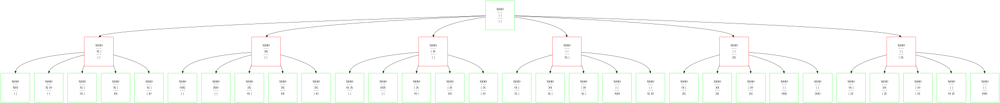

In [ ]:
#displaying some trees, preliminary tests
#tree of depth 2  
pos = [["X", "O", "O"],
       [" ", " ", " "],
       [" ", " ", " "]]

#we calculate our next possible moves for ONE TURN by using the current position
#since O went twice, it's X's turn 
moves = calculate("X", pos)

#initialize our tree 
tictactree = TicTacTree()

#create our root node with our current board position
root = tictactree.insert(create_board(pos))

#loop through all possible next moves 
for potential_pos in moves:
  new_root = tictactree.insert(create_board(potential_pos), p = root) #create node
  next_moves = calculate("O", potential_pos)  #loop through NEXT set move, which is now O's turn again
  for next_move in next_moves: #another iteration over next set of moves 
    tictactree.insert(create_board(next_move), p = new_root)


#visualize stuff 
dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
display(dot)

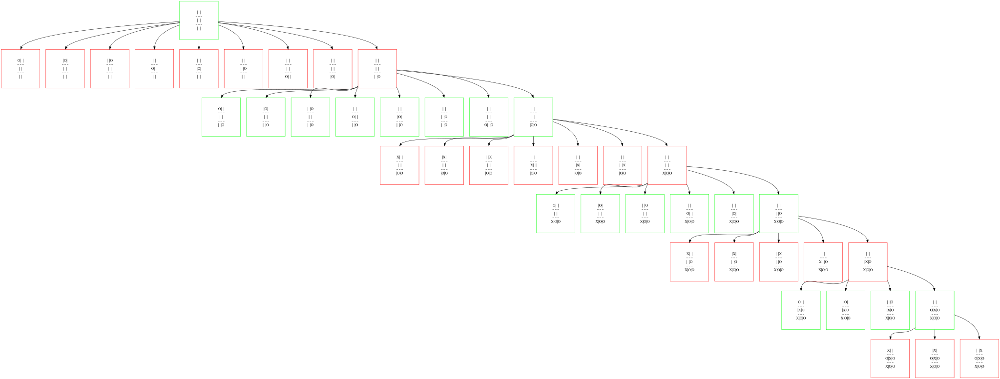

In [ ]:
#displaying a terminal state expansion from starting state, expanding only the right most state  
pos = [[" ", " ", " "],
       [" ", " ", " "],
       [" ", " ", " "]]
      
curr_move = ["O", "X"]  
player = 0
moves = calculate(curr_move[player%2], pos)


tictactree = TicTacTree()
root = tictactree.insert(create_board(pos))


#now we will expand the rightmost state every single time
#illustrates how even a perfect game has a lot of states
#given this is only 1 sequence of moves that could be played, resulting in 1 unique end result
while(len(moves) != 0):
  for potential_pos in moves:
    new_root = tictactree.insert(create_board(potential_pos), p = root)
  moves = calculate(curr_move[player%2], potential_pos)
  root = new_root
  player += 1


dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
display(dot)

# adding minimax logic

In [ ]:
#use recursion to loop through, figure out minimax values, and plot 

def plot(moves, pos, root, curr_player):
  moves = calculate(curr_player, pos) #first, calculate number of moves 

  #BASE CASE if no moves can be played, either because of draw or win 
  if len(moves) == 0: 
    node = tictactree.insert(create_board(pos), p = root) #insert terminal state node 

    #check if anyone won       
    result = checkWin(pos)
    
    if result == "X":     #in perspective of player O, which goes first, -1 is loss
      node.reward = -1  #we will set the reward of that node, and propagate it up
      reward = -1
    elif result == "O":   #in perspective of O, which goes first, 1 is win 
      node.reward = 1 #set reward of node 
      reward = 1
    else:                 #draw
      node.reward = 0
      reward = 0     
    return reward #return reward for parent nodes 
  else: #RECURSIVE CASE, if there are still multiple moves to be played
    node = tictactree.insert(create_board(pos), p = root) #first, we want to insert the branch node 
    rewards = []  #for storing all the possible rewards 
    if curr_player == "X":  #change up the player when we iterate 1 layer down. Eg if current player is O, then the next turn it will be X
      curr_player = "O"
    else:
      curr_player = "X"
    
    #RECURSION 
    for move in moves:  #loop through ALL next possible moves generated by calculate method  
      rewards.append(plot(moves, move, node, curr_player))  #append the reward from each branch 
    
    
    #minimaxing logic
    if node.optimzer == "max": #if our current node is a max node, then we take the max of all possible rewards 
      node.reward = max(rewards) #make sure to assign new rewards
      return max(rewards)
    else:                      #if our current node is a min node, then we take the min of all possible rewards 
      node.reward = min(rewards)  #make sure to also assign new rewards to our current node 
      return min(rewards)

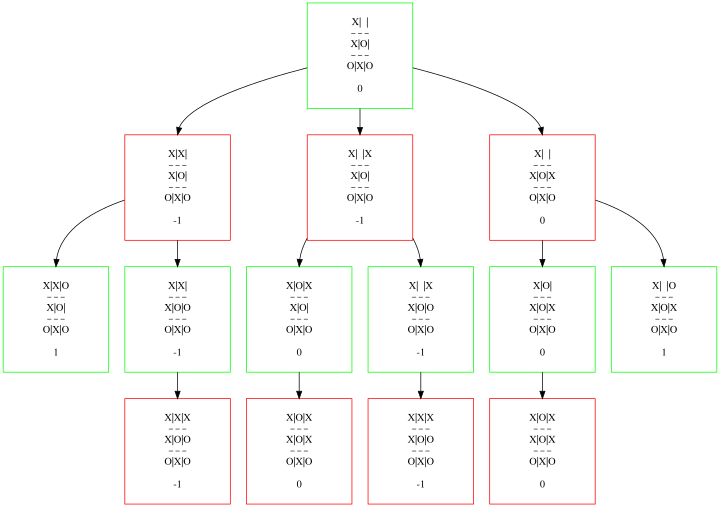

In [ ]:
#use minimax to play out a tic tac toe game that was half finished
#the value for the root node is the ultimate result if both players play optimally
#since it is 0, that means if both players play optimally, we have a draw 
#minimizing nodes in red will take the minimum reward (best for the opposite player)
#maximizing nodes in green will take the maximum reward (best for current player) 

tictactree = TicTacTree()

pos = [["X", " ", " "],
       ["X", "O", " "],
       ["O", "X", "O"]]
plot(None, pos, root, "X")

dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
dot.attr(size = "10, 10!")
display(dot)

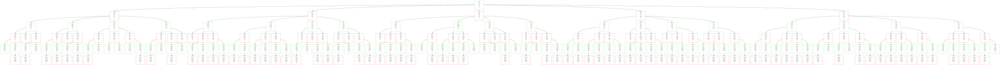

In [ ]:
#lets plot some states 
tictactree = TicTacTree()

pos = [["X", "O", " "],
       [" ", "O", " "],
       [" ", "X", " "]]
plot(None, pos, root, "O")

dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
dot.attr(size = "150, 150!")
display(dot)

In [ ]:
#lets plot some states 
tictactree = TicTacTree()

pos = [["X", "O", " "],
       [" ", " ", " "],
       [" ", " ", " "]]
plot(None, pos, root, "O")

dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
dot.attr(size = "4000, 4000!")
display(dot)

In [ ]:
#lets plot the beginning state
#this is probably gonna take forever 
tictactree = TicTacTree()

pos = [[" ", " ", " "],
       [" ", " ", " "],
       [" ", " ", " "]]
plot(None, pos, root, "O")

dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
dot.attr(size = "100000, 100000!")
display(dot)

KeyboardInterrupt: ignored

In [ ]:
dot = tictactree.visualize()
dot = tictactree.visualize(TreeNode(12))
dot.attr(size = "100000, 100000!")
display(dot)

KeyboardInterrupt: ignored